In [1]:
using Distributions
using Plots
using MultivariateStats
using LinearAlgebra
import SpecialFunctions.erfc
import Statistics.std

# Financial Return Data

Source: Fagereng etal. (2016, AER P&P),
https://www.aeaweb.org/articles?id=10.1257/aer.p20161022

- average return
- s.d. return
- annual data: 1994 - 2013

In [2]:
mean_return = [0.034962971,0.033016693,0.033402823,0.027331134,0.036134217,0.040393546,
               0.043487873,0.041918445,0.037621688,0.02663671,0.017331908,0.024360182,
               0.021106459,0.031944051,0.038339201,0.017175036,0.021304199,0.024184169,
               0.024161763,0.027676426];
std_dev_return = [0.036463846,0.033065073,0.037798624,0.038744509,0.038689133,0.039843991,
                  0.053244893,0.041973334,0.045639943,0.042901404,0.042556502,0.06061466,
                  0.038314983,0.045965835,0.042857248,0.024834679,0.031804338,0.035859797,
                  0.031907346,0.040183429];

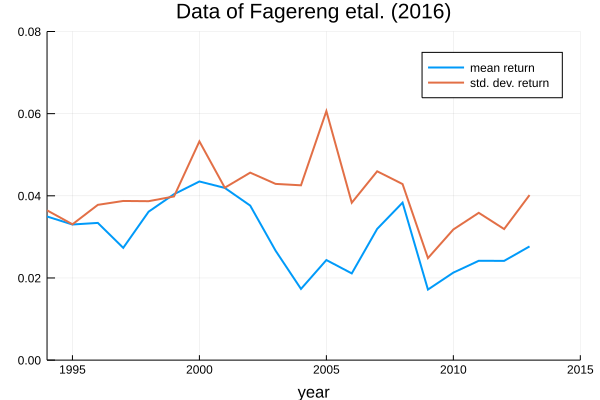

In [3]:
xx = 1994:1:2013  # time line

plot(xx, mean_return,
         title="Data of Fagereng etal. (2016)",
         label="mean return",
         xlabel="year",
         xlims=(1994, 2015),
         ylims=(0, 0.08),
         lw=2,
         legend=true)

plot!(xx, std_dev_return,
         label="std. dev. return",
         lw=2,
         legend=true)

## Transformation of Financial Return Data 

#### Consider the IID lognormal case:
> $\log R_t = \mu + \sigma \zeta_t$, $\{\zeta_t\} \overset{iid}{\sim} N(0,1)$

Then 
- $ \mathbb{E} \, R = \exp(\mu + \sigma^2 / 2)$
- $ Var \, (R) = \mathbb{E} \, R^2 - (\mathbb{E} \, R)^2 
    = \exp (2 \mu + 2 \sigma^2) - \exp (2 \mu + \sigma^2)$

Compared with Figure 1 of Fagereng etal. (2016), 
- $\mathbb{E} \, R = $ mean return $+ 1$
- $Var \, (R) = $ s.d. return$^2$
- annual data of mean return and s.d. return : available (1994 - 2013)
- mean return $ \approx 0.03$, $\;$ s.d. return $ \approx 0.04$

Simple calculation yields:
- $\mu = \log \left[ \frac{\mathbb{E} \, R}{\sqrt{\frac{Var \,(R)}{(\mathbb{E} \, R)^2} + 1}} \right]$
  $\quad$ and $\quad$
  $\sigma = \sqrt{ \log \left( \frac{Var \, (R)}{(\mathbb{E} \, R)^2} + 1 \right) }$

In [4]:
# transformation function 
function data_trans(data1::Real, data2::Real)
    μ = log((data1 + 1) / sqrt((data2^2) / ((data1 + 1)^2) + 1))
    σ = sqrt(log((data2^2) / ((data1 + 1)^2) + 1))
    return μ, σ
end

len = length(mean_return)
data = Array{Float64, 2}(undef, len, 2)

for i in 1:len
    data[i, 1], data[i, 2] = data_trans(mean_return[i], std_dev_return[i])
end

data_μ, data_σ = data[:, 1], data[:, 2];  # transformed data series {μ_t} and {σ_t}

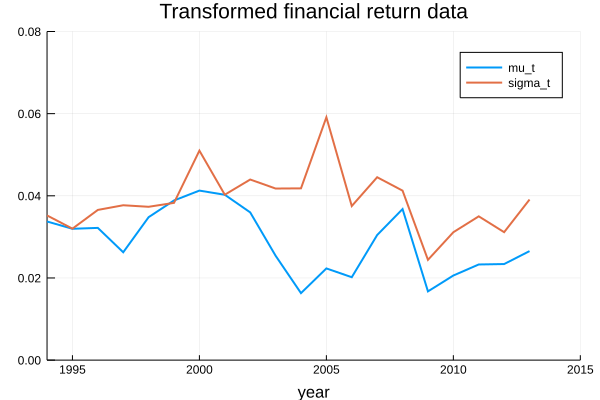

In [5]:
xx = 1994:1:2013

plot(xx, data_μ,
         title="Transformed financial return data",
         label="mu_t",
         xlabel="year",
         xlims=(1994, 2015),
         ylims=(0, 0.08),
         lw=2,
         legend=true)

plot!(xx, data_σ,
         label="sigma_t",
         lw=2,
         legend=true)

# Modelling Capital Income Risk


### Financial Return Process

> $\log R_t = \mu_t + \sigma_t \zeta_t$, 
$\{\zeta_t\} \overset{iid}{\sim} N(0,1)$
- $\{\mu_t\}$, $\{\sigma_t\}$ : AR(1) processes

### OLS Estimation Result:  $\{\mu_t\}$ process

> $\mu_t = \bar{\mu} (1 - \rho_\mu) + \rho_\mu \mu_{t-1} 
    + \upsilon_t^\mu$, 
  $\, \{\upsilon_t^\mu\} \overset{iid}{\sim} N(0, \delta_\mu^2)$ <br/>
  - $\bar{\mu} = 0.028100825548371282$
  - $\rho_\mu = 0.5721707316453398$
  - $\delta_\mu = 0.006659757215869284$

In [6]:
# constructing data matrices
X = Array{Float64,2}(undef, length(data_μ)-1, 2)
X[:,1] = ones(length(data_μ) - 1)
X[:,2] = data_μ[1:end-1]
Y = data_μ[2:end]

# estimating ̄μ and ρ_μ
sol = (X' * X) \ (X' * Y)  # OLS regression, method 1
#sol2 = inv(X' * X) * X' * Y  # OLS regression, method 2
#sol3 = llsq(X, Y, bias=false)  # OLS regression, method 3

μ_bar, ρ_μ = sol[1] / (1 - sol[2]), sol[2]    # estimated parameter values

# estimating δ_μ by calculating the standard error
δ_μ = sqrt(sum((Y - X * sol).^2) / (length(Y) - 2)) 

# stationary standard deviation of {μ_t}, i.e., N(μ_bar, stat_std_μ^2)
stat_std_μ = sqrt(δ_μ^2 / (1 - ρ_μ^2))

println("Estimation Result: ")
println("")
println("μ_bar : $μ_bar")
println("ρ_μ   : $ρ_μ")
println("δ_μ   : $δ_μ")
println("")
println("stationary std. dev. : $stat_std_μ")
println("")

Estimation Result: 

μ_bar : 0.028100825548371282
ρ_μ   : 0.5721707316453398
δ_μ   : 0.006659757215869284

stationary std. dev. : 0.008120322873665927



### OLS Estimation Result: $\{\sigma_t\}$ process 

$\log \sigma_t = \bar{\sigma} (1 - \rho_\sigma) 
    + \rho_\sigma \log \sigma_{t-1} 
    + \upsilon_t^\sigma$,
  $\, \{\upsilon_t^\sigma\} \overset{iid}{\sim} N(0, \delta_\sigma^2)$
  - $\bar{\sigma} = -3.2556044264516704$
  - $\rho_\sigma = 0.2894534139396562 $
  - $\delta_\sigma = 0.18962151653401482$

In [7]:
# constructing data matrices
Xs = Array{Float64,2}(undef, length(data_σ)-1, 2)
Xs[:,1] = ones(length(data_σ) - 1)
Xs[:,2] = log.(data_σ[1:end-1])
Ys = log.(data_σ[2:end])

sol_σ = (Xs' * Xs) \ (Xs' * Ys)  # OLS regression, method 1
#sol_σ2 = inv(Xs' * Xs) * Xs' * Ys  # OLS regression, method 2
#sol_σ3 = llsq(Xs, Ys, bias=false)  # OLS regression, method 3

σ_bar, ρ_σ = sol_σ[1] / (1 - sol_σ[2]), sol_σ[2]    # estimated parameter values

# estimating δ_σ by calculating the standard error
δ_σ = sqrt(sum((Ys - Xs * sol_σ).^2) / (length(Ys) - 2))

# stationary std of {log σ_t} : LN(σ_bar, stat_std_logσ^2)
stat_std_logσ = sqrt(δ_σ^2 / (1 - ρ_σ^2))

# stationary mean of {σ_t}
stat_mean_σ = exp(σ_bar + stat_std_logσ^2 / 2)

println("Estimation Result: ")
println("")
println("σ_bar : $σ_bar")
println("ρ_σ   : $ρ_σ")
println("δ_σ   : $δ_σ")
println("")
println("stationary std. dev of {log σ_t}  : $stat_std_logσ")
println("")
println("stationary mean of {σ_t}          : $stat_mean_σ")
println("")

Estimation Result: 

σ_bar : -3.2556044264516704
ρ_σ   : 0.2894534139396562
δ_σ   : 0.18962151653401482

stationary std. dev of {log σ_t}  : 0.19810183977854054

stationary mean of {σ_t}          : 0.03932156208539589

